## Pre-processing ##
Now that everything is set up, we want to load our data, but first we need to load a couple of useful python packages:


In [5]:
from sys import stdout

import random
import numpy as np

import matplotlib.pyplot as plt

from PIL import Image
import math
import keras
import keras.backend as K
import segmentation_models as sm
import cv2
import copy

Segmentation Models: using `keras` framework.


In [6]:
from segments import SegmentsClient, SegmentsDataset
from segments.utils import export_dataset
from segments.utils import get_semantic_bitmap

# load and plot dataset from segments.ai

In [7]:
client = SegmentsClient('3d2505cf0a95d64eabb333d76ecb472bcca6a456')
dataset_name_n = 'ayda/faullt_8'
dataset_name_1 = 'ayda/faul_1_new'
dataset_name_2 = 'ayda/fault_2'
dataset_name_3 = 'ayda/fault_3'
dataset_name_4 = 'ayda/fault_4'
dataset_name_5 = 'ayda/fault_5'
dataset_name_7 = 'ayda/fault_7'


# Get a list of image URLs
release_n = client.get_release(dataset_name_n, 'fault_13.a') 
release_1 = client.get_release(dataset_name_1, 'fault_1') 
release_2 = client.get_release(dataset_name_2, 'fault_2') 
release_3 = client.get_release(dataset_name_3, 'fault_3')
release_4 = client.get_release(dataset_name_4, 'fault_4')
release_5 = client.get_release(dataset_name_5, 'fault_5')
release_7 = client.get_release(dataset_name_7, 'fault_7')

## loading data and lable then show together

Initializing dataset...
Preloading all samples. This may take a while...


100%|███████████████████████████████████████████████████████████████████████████████████| 9/9 [00:00<00:00, 115.66it/s]

Initialized dataset with 9 images.


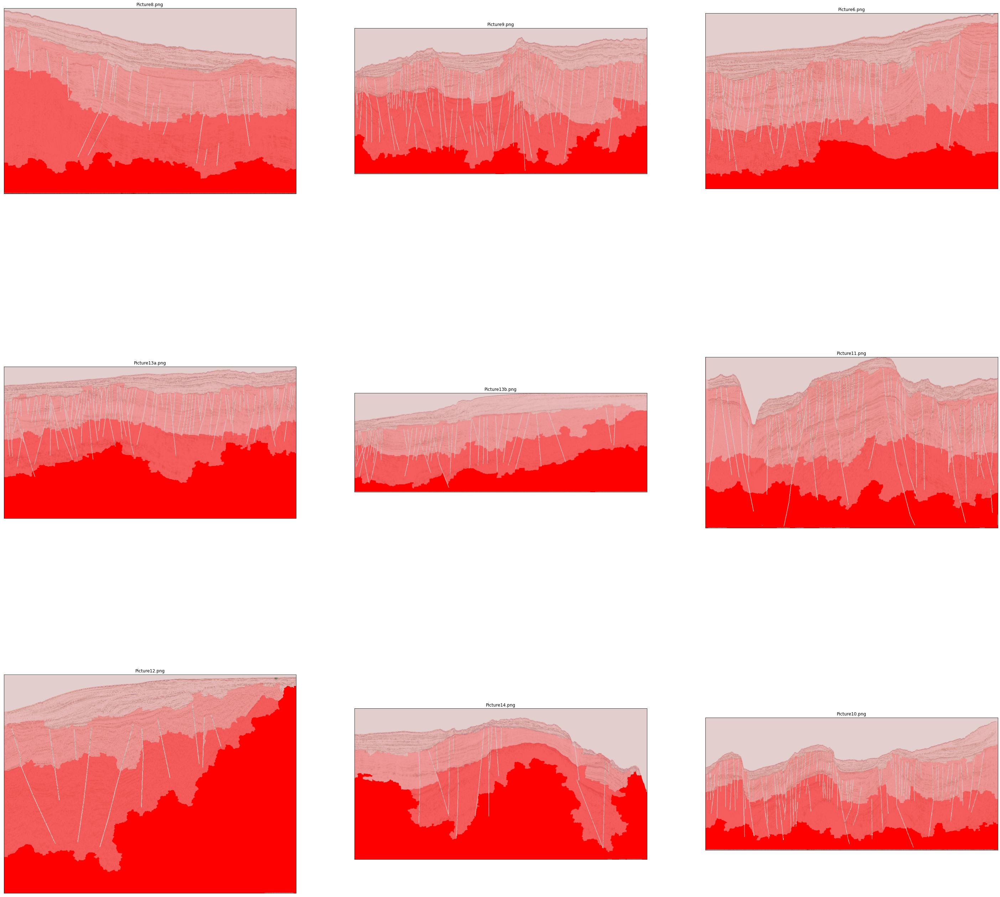

In [8]:
# from google.colab import widgets

def load_data_label(sample):

    label = get_semantic_bitmap(sample['segmentation_bitmap'], sample['annotations'])
    data = np.asarray(sample['image']) / 255.
    #converting to grayscale
#         data = 0.2989*data[:,:,0] + 0.5870*data[:,:,1] + 0.1140*data[:,:,2]
#         data = Image.open(data_dir + sample['file_name'])
    label = np.asarray(label)
    return data, label


def plot_overlay(image, label, i):
    (tmax, xmax) = np.shape(label)

    label_rgb = np.zeros((tmax,xmax,4), 'uint8')
    label_rgb[:,:,0] = 255
    label_rgb[:,:,1] = 255 - 255*label/np.max(label)
    label_rgb[:,:,2] = 255 - 255*label/np.max(label)
    label_rgb[:,:,3] = 255*label/np.max(label)   
    
    img = Image.fromarray(label_rgb, mode='RGBA')
    
#     img_gray = 0.2989*image[:,:,0] + 0.5870*image[:,:,1] + 0.1140*image[:,:,2]
    image_rgb = np.zeros((tmax,xmax,4), 'uint8')    
    image_rgb[:,:,0] = 255*image[:,:,0]
    image_rgb[:,:,1] = 255*image[:,:,1]
    image_rgb[:,:,2] = 255*image[:,:,2]
#     image_rgb[:,:,0:3] = 255. * image
    image_rgb[:,:,3] = 255
    
    background = Image.fromarray(image_rgb, mode='RGBA') 
    background.paste(img, (0, 0), img)

#     background = Image.fromarray(image_rgb, mode='RGBA') 
#     print(image.shape)
#     print(label.shape)
#     background.paste(label, (0, 0), label)

    plt.subplot(3,3,i+1).imshow(background)
    plt.title(sample['file_name'])
    plt.xticks([])
    plt.yticks([])



release = [release_n]
plt.figure(figsize=(50,50))
dataset = SegmentsDataset(release_n)
for i, sample in enumerate(dataset): 
    data, label = load_data_label(sample)
    
    plot_overlay(data, label, i)
#     plt.subplot(1,3,i+1).xticks([])
#     plt.yticks([])

In [9]:
def load_data_label(release):
    dataset = SegmentsDataset(release)
    for sample in dataset:
        label = get_semantic_bitmap(sample['segmentation_bitmap'], sample['annotations'])
        label = np.stack([label==v for v in np.unique(label)], axis=-1)
        data = np.asarray(sample['image']) / 255.
        #converting to grayscale
#         data = 0.2989*data[:,:,0] + 0.5870*data[:,:,1] + 0.1140*data[:,:,2]
#         data = Image.open(data_dir + sample['file_name'])
    label = np.asarray(label)
    return data, label


def patchify(data, label, size, number, seg):

    (t_max, x_max, _) = label.shape    
        
    n = 0
    X = np.zeros((number,size,size,3))
    Y = np.zeros((number,size,size,1))
    
    for t in range(size//2+1, t_max-size//2, 10):
        for x in range(size//2+1, x_max-size//2, 10):
            if n<number and label[t,x,seg]:
                X[n, ...] = data[t-size//2:t+size//2, x-size//2:x+size//2, :]
                Y[n, :,:,0] = label[t-size//2:t+size//2, x-size//2:x+size//2, 1]
                n = n + 1
            
    return X, Y


# Parameters
size       = 64
s          = size//2
threshold  = 0
stride     = 10
num_val    = 2000
np.random.seed(100)

# Validation data from inline 300
X_val = np.zeros((num_val,size,size,3))
Y_val = np.zeros((num_val,size,size,1))

seg = [3,4]

n = 0
release_list = [release_1]
for i, release in enumerate(release_list):
    seismic, label = load_data_label(release)
    Num = np.sum(label[s:-s:stride,s:-s:stride, seg[i]])
    X_val[n:n+num_val,...], Y_val[n:n+num_val,...] = patchify(seismic[:,:,:3], label, size, num_val, seg[i]) 
    n += num_val

# Training data from inlines 

release_list = [release_2, release_3, release_4, release_5, release_7, release_n]
seg = [3,4]

n = 0
num_train = []
for i, release in enumerate(release_list):
    seismic, label = load_data_label(release)
    Num += int(np.sum(label[s:-s:stride,s:-s:stride,seg[0]])//stride) + int(np.sum(label[s:-s:stride,s:-s:stride,seg[1]])//stride)
    num_train.append(Num)

X_train = np.zeros((Num,size,size,3))
Y_train = np.zeros((Num,size,size,1))

for s_i in seg:
    for i, release in enumerate(release_list):
        seismic, label = load_data_label(release)
        X_train[n:n+num_train[i],...], Y_train[n:n+num_train[i],...] = patchify(seismic[:,:,:3], label, size, num_train[i], s_i) 

def load_data_label(sample):

    label = get_semantic_bitmap(sample['segmentation_bitmap'], sample['annotations'])
    label = np.stack([label==v for v in np.unique(label)], axis=-1)
    data = np.asarray(sample['image']) / 255.

    return data, label

dataset = SegmentsDataset(release_n)

for s_i in seg:
    for sample in dataset:
        seismic, label = load_data_label(sample)
        Num = np.sum(label[s:-s:stride,s:-s:stride,s_i])
        X_temp, Y_temp = patchify(seismic[:,:,:3], label, size, Num, s_i) 
        X_train = np.concatenate((X_train, X_temp), axis=0)
        Y_train = np.concatenate((Y_train, Y_temp), axis=0)

Initializing dataset...
Preloading all samples. This may take a while...


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 41.80it/s]

Initialized dataset with 1 images.


Initializing dataset...
Preloading all samples. This may take a while...


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 45.54it/s]

Initialized dataset with 1 images.


Initializing dataset...
Preloading all samples. This may take a while...


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 26.39it/s]

Initialized dataset with 1 images.


Initializing dataset...
Preloading all samples. This may take a while...


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 36.84it/s]

Initialized dataset with 1 images.


Initializing dataset...
Preloading all samples. This may take a while...


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 29.49it/s]

Initialized dataset with 1 images.


Initializing dataset...
Preloading all samples. This may take a while...


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 29.47it/s]

Initialized dataset with 1 images.


Initializing dataset...
Preloading all samples. This may take a while...


100%|███████████████████████████████████████████████████████████████████████████████████| 9/9 [00:00<00:00, 136.67it/s]

Initialized dataset with 9 images.


Initializing dataset...
Preloading all samples. This may take a while...


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 47.74it/s]

Initialized dataset with 1 images.


Initializing dataset...
Preloading all samples. This may take a while...


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 33.41it/s]

Initialized dataset with 1 images.


Initializing dataset...
Preloading all samples. This may take a while...


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 40.11it/s]

Initialized dataset with 1 images.


Initializing dataset...
Preloading all samples. This may take a while...


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 34.58it/s]

Initialized dataset with 1 images.


Initializing dataset...
Preloading all samples. This may take a while...


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 37.13it/s]

Initialized dataset with 1 images.


Initializing dataset...
Preloading all samples. This may take a while...


100%|███████████████████████████████████████████████████████████████████████████████████| 9/9 [00:00<00:00, 136.39it/s]

Initialized dataset with 9 images.


Initializing dataset...
Preloading all samples. This may take a while...


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 45.58it/s]

Initialized dataset with 1 images.


Initializing dataset...
Preloading all samples. This may take a while...


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 30.38it/s]

Initialized dataset with 1 images.


Initializing dataset...
Preloading all samples. This may take a while...


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 37.10it/s]

Initialized dataset with 1 images.


Initializing dataset...
Preloading all samples. This may take a while...


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 35.82it/s]

Initialized dataset with 1 images.


Initializing dataset...
Preloading all samples. This may take a while...


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 37.10it/s]

Initialized dataset with 1 images.


Initializing dataset...
Preloading all samples. This may take a while...


100%|███████████████████████████████████████████████████████████████████████████████████| 9/9 [00:00<00:00, 136.73it/s]

Initialized dataset with 9 images.


Initializing dataset...
Preloading all samples. This may take a while...


100%|███████████████████████████████████████████████████████████████████████████████████| 9/9 [00:00<00:00, 130.78it/s]

Initialized dataset with 9 images.


Before training, it's always a good idea to check the training data, so let's do that:

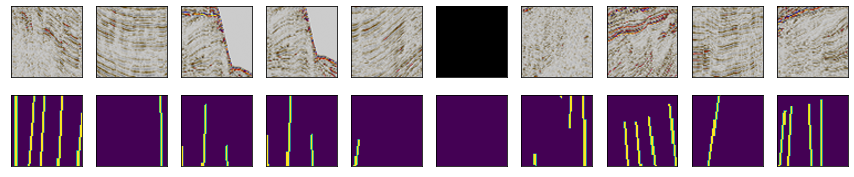

In [10]:
fig, axs = plt.subplots(2, 10, figsize=(15,3))

K = []
for m in range(10):
    k = random.randint(0,2000)
    K.append(k)
    axs[0,m].imshow(X_train[k], interpolation='spline16', cmap=plt.cm.gray, aspect=1)
    axs[0,m].set_xticks([])
    axs[0,m].set_yticks([])

# K = np.stack(K)
for m in range(10):
    axs[1,m].imshow(Y_train[K[m]], interpolation='spline16', aspect=1)
    axs[1,m].set_xticks([])
    axs[1,m].set_yticks([])
    k += 1


What do you notice?

* Is it an easy task?
* Could you predict the masks?
* Can we learn more from some examples?

## Training ##
To train our model, we need to define its architecture. 



# Now you can train your convolutional neural net using the data generator:
##I increased epochs rank!(30 times my model was trained)

The Dice Loss is a loss function used in deep learning for image segmentation tasks. It is commonly used to train neural networks to segment objects in medical images, such as MRI or CT scans.In practice, the DiceLoss() function takes two input tensors: the predicted segmentation mask and the ground truth mask. It then computes the Dice Loss between these two masks and returns the loss value as a scalar tensor.

The basic idea behind the Dice Loss is to calculate the similarity between the predicted segmentation mask and the ground truth mask using the Dice coefficient. The Dice coefficient is a measure of overlap between two sets, ranging from 0 (no overlap) to 1 (perfect overlap).

The Dice Loss function is defined as 1 minus the Dice coefficient, or 1 - (2 * intersection) / (sum of predicted mask + sum of ground truth mask), where "intersection" is the number of overlapping pixels between the predicted mask and ground truth mask.

In other words, the Dice Loss penalizes the model for making incorrect predictions, and the amount of penalty is proportional to the degree of dissimilarity between the predicted and ground truth masks. The goal of the training process is to minimize the value of the Dice Loss, which will result in a model that is better at segmenting objects in images.

The Dice Loss is often used in conjunction with other loss functions, such as the binary cross-entropy loss or focal loss, to improve the overall performance of the model.
The Dice coefficient, also known as the Sørensen–Dice coefficient, is a measure of similarity between two sets. It is commonly used in image segmentation tasks in computer vision, where it is used to measure the degree of overlap between a predicted segmentation mask and a ground truth mask.

The Dice coefficient is defined as the ratio of the size of the intersection of the two sets to the size of the union of the two sets. Mathematically, it is expressed as:

dice_coefficient = (2 * |X ∩ Y|) / (|X| + |Y|)

where X and Y are the two sets being compared, |X| and |Y| represent the size of the sets, and |X ∩ Y| represents the size of the intersection of the two sets.

The Dice coefficient ranges from 0 to 1, with 0 indicating no overlap between the two sets, and 1 indicating perfect overlap. It is a commonly used evaluation metric for image segmentation tasks, as it is sensitive to both the size and location of the predicted segmentation mask relative to the ground truth mask.

In the context of deep learning, the Dice coefficient is often used as part of a loss function, such as the Dice Loss, to train neural networks for image segmentation tasks. The goal of the training process is to minimize the value of the Dice Loss, which will result in a model that is better at segmenting objects in images.

In [11]:
dice_loss = sm.losses.DiceLoss()
metrics= [sm.metrics.IOUScore(threshold=0.5), sm.metrics.FScore(threshold=0.5)]
size = 64
# model = UNet()
model = sm.Unet('mobilenet', classes=1, activation='sigmoid', decoder_filters=(64, 32, 32, 16, 4))
model.compile(optimizer="Adam", loss=dice_loss, metrics=metrics)

model.summary()

C:\Users\aazadkhorasa\AppData\Roaming\Python\Python39\site-packages\keras_applications\mobilenet.py:207: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  warnings.warn('`input_shape` is undefined or non-square, '


Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, None, None,  0           []                               
                                 3)]                                                              
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, None, None,   0           ['input_1[0][0]']                
                                3)                                                                
                                                                                                  
 conv1 (Conv2D)                 (None, None, None,   864         ['conv1_pad[0][0]']              
                                32)                                                           

                                                                                                  
 conv_dw_4_relu (ReLU)          (None, None, None,   0           ['conv_dw_4_bn[0][0]']           
                                128)                                                              
                                                                                                  
 conv_pw_4 (Conv2D)             (None, None, None,   32768       ['conv_dw_4_relu[0][0]']         
                                256)                                                              
                                                                                                  
 conv_pw_4_bn (BatchNormalizati  (None, None, None,   1024       ['conv_pw_4[0][0]']              
 on)                            256)                                                              
                                                                                                  
 conv_pw_4

 on)                            512)                                                              
                                                                                                  
 conv_pw_8_relu (ReLU)          (None, None, None,   0           ['conv_pw_8_bn[0][0]']           
                                512)                                                              
                                                                                                  
 conv_dw_9 (DepthwiseConv2D)    (None, None, None,   4608        ['conv_pw_8_relu[0][0]']         
                                512)                                                              
                                                                                                  
 conv_dw_9_bn (BatchNormalizati  (None, None, None,   2048       ['conv_dw_9[0][0]']              
 on)                            512)                                                              
          

 conv_dw_13_bn (BatchNormalizat  (None, None, None,   4096       ['conv_dw_13[0][0]']             
 ion)                           1024)                                                             
                                                                                                  
 conv_dw_13_relu (ReLU)         (None, None, None,   0           ['conv_dw_13_bn[0][0]']          
                                1024)                                                             
                                                                                                  
 conv_pw_13 (Conv2D)            (None, None, None,   1048576     ['conv_dw_13_relu[0][0]']        
                                1024)                                                             
                                                                                                  
 conv_pw_13_bn (BatchNormalizat  (None, None, None,   4096       ['conv_pw_13[0][0]']             
 ion)     

                                                                                                  
 decoder_stage2b_bn (BatchNorma  (None, None, None,   128        ['decoder_stage2b_conv[0][0]']   
 lization)                      32)                                                               
                                                                                                  
 decoder_stage2b_relu (Activati  (None, None, None,   0          ['decoder_stage2b_bn[0][0]']     
 on)                            32)                                                               
                                                                                                  
 decoder_stage3_upsampling (UpS  (None, None, None,   0          ['decoder_stage2b_relu[0][0]']   
 ampling2D)                     32)                                                               
                                                                                                  
 decoder_s

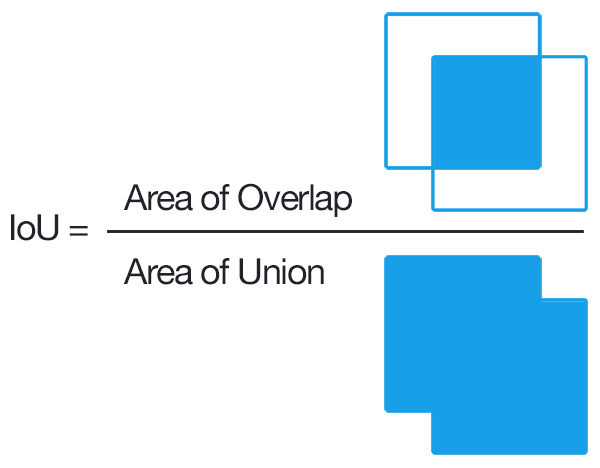
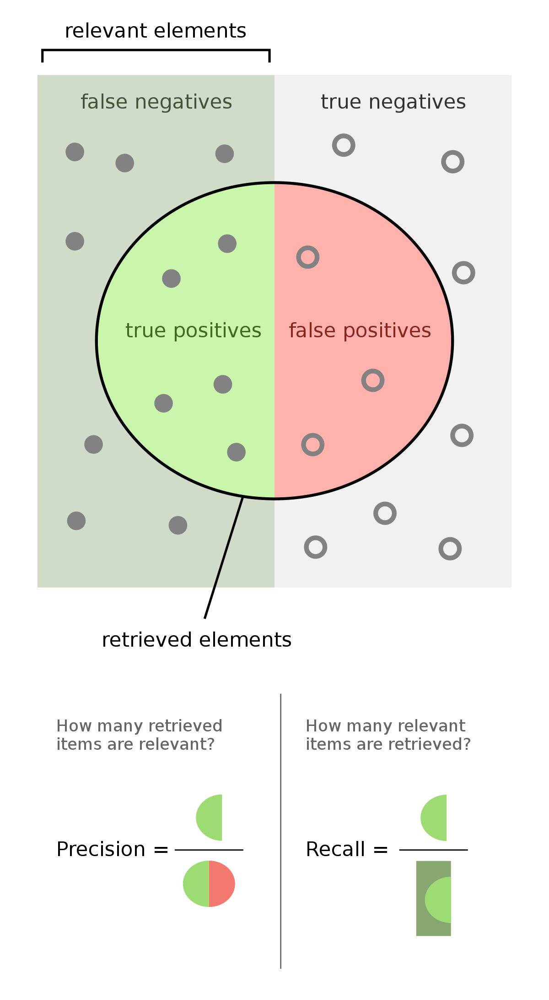
### threshold of 0.5 used to convert the predicted probabilities to binary mask predictions.

# from keras.callbacks import CSVLogger
# csvlogger = CSVLogger('history_14_Dec_clu_dice.csv', append=True)
# history = model.fit(X_train, 
                    Y_train, 
                    batch_size=32,
                    validation_data=(X_val, Y_val), 
                    epochs=30,
                    callbacks=[csvlogger])


# model.save('checkpoint_tot3_14_Dec_clu_dice')

To visualize our training, you can plot learning curves:

In [12]:
model.load_weights('checkpoint_tot3_14_Dec_clu_dice')

In [8]:
import pandas as pd
history = pd.read_csv('history_14_Dec_clu_Dice.csv')

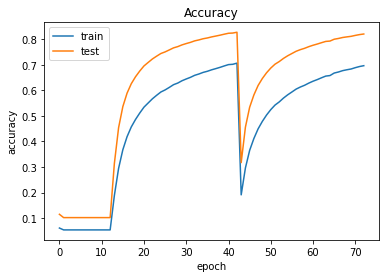

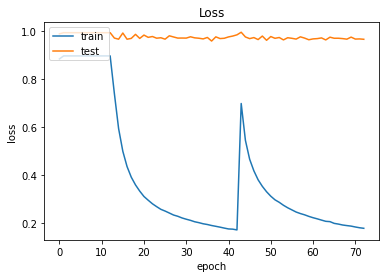

In [8]:
plt.plot(history['iou_score'])
plt.plot(history['f1-score'])
plt.title('Accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

plt.plot(history['loss'])
plt.plot(history['val_loss'])
plt.title('Loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

In [127]:
from keras import backend as K

def F1_score(y_true, y_pred, smooth=1):
    intersection = K.sum(y_true * y_pred, axis=[1,2,3])
    union = K.sum(y_true, axis=[1,2,3]) + K.sum(y_pred, axis=[1,2,3])
    dice = K.mean((2. * intersection + smooth)/(union + smooth), axis=0)
    return dice

In [128]:
y_pred = model.predict(X_val)
Y_pred = 1. * (y_pred>0.5)
Y_true = Y_val

print(F1_score(Y_true, Y_pred).numpy())


63/63 [==============================] - 2s 15ms/step
0.07328532172289584


and a confusion matrix:

In [ ]:
from sklearn.metrics import confusion_matrix

Y_pred = model.predict(X_val)
Y_true = Y_val    

cm = np.zeros((2,2))

for n in range(Y_true.shape[0]):

  y_true = Y_true[n,:,:,0].round().flatten()
  y_pred = Y_pred[n,:,:,0].round().flatten()

  cm_batch = confusion_matrix(y_true, y_pred)
              

  cm = cm + cm_batch

In [ ]:
cmap=plt.cm.Blues
normalize = True

title = 'Normalized confusion matrix'


# Only use the labels that appear in the data
classes = ['No fault','Fault']

# Normalize
cm_norm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]


fig, ax = plt.subplots()
im = ax.imshow(cm_norm, interpolation='nearest', cmap=cmap)
ax.figure.colorbar(im, ax=ax)
# We want to show all ticks...
ax.set(xticks=np.arange(cm_norm.shape[1]),
       yticks=np.arange(cm_norm.shape[0]),
       # ... and label them with the respective list entries
       xticklabels=classes, yticklabels=classes,
       title=title,
       ylabel='True label',
       xlabel='Predicted label')

# Rotate the tick labels and set their alignment.
plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
         rotation_mode="anchor")

# Loop over data dimensions and create text annotations.
fmt = '.2f' if normalize else 'd'
thresh = cm_norm.max() / 2.
for i in range(cm_norm.shape[0]):
    for j in range(cm_norm.shape[1]):
        ax.text(j, i, format(cm_norm[i, j], fmt),
                ha="center", va='center',
                color="white" if cm_norm[i, j] > thresh else "black")
fig.tight_layout()

counted number of fault in each patch , how large are the structer ,
how we are going to measure to look at top to the bottom,
if we change the patch size how this things wille change

In [13]:
def tile_segment(data, label, wsize, dt, dx, seg):
    
    (t_max, x_max, _) = data.shape    
    
    n_patch = (t_max//dt+1)*(x_max//dx+1)
    data_patch = np.zeros((n_patch,wsize,wsize,3)) 

    n = 0
    T = []
    N = []
    for t in range(0, t_max, dt):
        for x in range(0, x_max, dx):  
            if label[t,x,seg[0]] or label[t,x,seg[1]] or label[t,x,seg[2]]:
                T.append([t,x])

                if t_max - t < wsize and x_max - x < wsize:
                    data_patch[n,:,:,:] = data[t_max-wsize:t_max, x_max-wsize:x_max,:3]
                elif x_max - x < wsize:
                    data_patch[n,:,:,:] = data[t:t+wsize, x_max-wsize:x_max,:3]
                elif t_max - t < wsize:
                    data_patch[n,:,:,:] = data[t_max-wsize:t_max, x:x+wsize,:3]
                else:
                    data_patch[n,:,:,:] = data[t:t+wsize,x:x+wsize, :3]  
                N.append(n)
            n = n + 1
    return data_patch, T, N

def tile_no_segment(data, wsize, dt, dx):
    
    (t_max, x_max, _) = data.shape    
    
    n_patch = (t_max//dt+1)*(x_max//dx+1)
    data_patch = np.zeros((n_patch,wsize,wsize,3)) 

    n = 0

    for t in range(0, t_max, dt):
        for x in range(0, x_max, dx):  
                if t_max - t < wsize and x_max - x < wsize:
                    data_patch[n,:,:,:] = data[t_max-wsize:t_max, x_max-wsize:x_max,:3]
                elif x_max - x < wsize:
                    data_patch[n,:,:,:] = data[t:t+wsize, x_max-wsize:x_max,:3]
                elif t_max - t < wsize:
                    data_patch[n,:,:,:] = data[t_max-wsize:t_max, x:x+wsize,:3]
                else:
                    data_patch[n,:,:,:] = data[t:t+wsize,x:x+wsize, :3]  
                n = n + 1

    return data_patch

In [14]:
def merge_segment(data_patch, t_max, x_max, wsize, dt, dx, T, N):

    data_new = np.zeros((t_max, x_max,3))
    count = np.zeros((t_max, x_max, 1))
    
    n = 0
    for t,x in T:

            if t_max - t < wsize and x_max - x < wsize:
                data_new[t_max-wsize:t_max, x_max-wsize:x_max,:] += data_patch[N[n],:,:,:]
                count[t_max-wsize:t_max, x_max-wsize:x_max,0] += 1
            elif x_max - x < wsize:
                data_new[t:t+wsize, x_max-wsize:x_max,:] += data_patch[N[n],:,:,:]
                count[t:t+wsize, x_max-wsize:x_max,0] += 1 
            elif t_max - t < wsize:
                data_new[t_max-wsize:t_max, x:x+wsize,:] += data_patch[N[n],:,:,:]
                count[t_max-wsize:t_max, x:x+wsize,0] += 1
            else:
                data_new[t:t+wsize,x:x+wsize,:] += data_patch[N[n],:,:,:]
                count[t:t+wsize,x:x+wsize,0] += 1 
            
            n = n + 1

    return data_new

def merge_no_segment(data_patch, t_max, x_max, wsize, dt, dx):

    data_new = np.zeros((t_max, x_max,3))
    count = np.zeros((t_max, x_max, 1))
    
    n = 0
    for t in range(0, t_max, dt):
        for x in range(0, x_max, dx):
            if t_max - t < wsize and x_max - x < wsize:
                data_new[t_max-wsize:t_max, x_max-wsize:x_max,:] += data_patch[n, :,:,:]
                count[t_max-wsize:t_max, x_max-wsize:x_max,0] += 1
            elif x_max - x < wsize:
                data_new[t:t+wsize, x_max-wsize:x_max,:] += data_patch[n,:,:,:]
                count[t:t+wsize, x_max-wsize:x_max,0] += 1 
            elif t_max - t < wsize:
                data_new[t_max-wsize:t_max, x:x+wsize,:] += data_patch[n,:,:,:]
                count[t_max-wsize:t_max, x:x+wsize,0] += 1
            else:
                data_new[t:t+wsize,x:x+wsize,:] += data_patch[n,:,:,:]
                count[t:t+wsize,x:x+wsize,0] += 1 

            n = n + 1

    return data_new/count


In [15]:
def plot_overlay(image, label, i):
    (tmax, xmax) = np.shape(label)

    label_rgb = np.zeros((tmax,xmax,4), 'uint8')
    label_rgb[:,:,0] = 255
    label_rgb[:,:,1] = 255 - 255*label/np.max(label)
    label_rgb[:,:,2] = 255 - 255*label/np.max(label)
    label_rgb[:,:,3] = 255*label /np.max(label)  
    
    img = Image.fromarray(label_rgb, mode='RGBA')
    
    image_rgb = np.zeros((tmax,xmax,4), 'uint8')    
    image_rgb[:,:,0] = 255*image[:,:,0]
    image_rgb[:,:,1] = 255*image[:,:,1]
    image_rgb[:,:,2] = 255*image[:,:,2]
#     image_rgb[:,:,0:3] = 255. * image
    image_rgb[:,:,3] = 255
    
    background = Image.fromarray(image_rgb, mode='RGBA') 
    background.paste(img, (0, 0), img)

#     background = Image.fromarray(image_rgb, mode='RGBA') 
#     print(image.shape)
#     print(label.shape)
#     background.paste(label, (0, 0), label)

    plt.subplot(9,1,i+1).imshow(background)
    plt.xticks([])
    plt.yticks([])

In [16]:
def load_data_label_no_segment(sample):
    
    label = get_semantic_bitmap(sample['segmentation_bitmap'], sample['annotations'])
    data = np.asarray(sample['image']) / 255.
    label = np.asarray(label)
    return data, label

def load_data_label_segment(sample):
    
    
    label = get_semantic_bitmap(sample['segmentation_bitmap'], sample['annotations'])
    label = np.stack([label==v for v in np.unique(label)], axis=-1)
    data = np.asarray(sample['image']) / 255.
    label = np.asarray(label)
    return data, label

Initializing dataset...
Preloading all samples. This may take a while...


100%|███████████████████████████████████████████████████████████████████████████████████| 9/9 [00:00<00:00, 130.78it/s]

Initialized dataset with 9 images.


(611, 1348, 4)


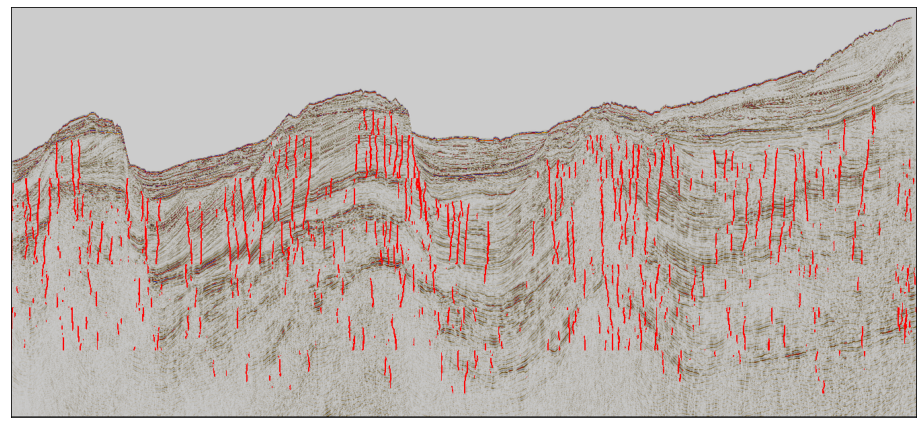

In [17]:
dt = 64
dx = 64

plt.figure(figsize=(100,80))
seg = [3,4,5]
    
dataset = SegmentsDataset(release_n)     
data, label = load_data_label_segment(dataset[8])
(t_max, x_max, _) = data.shape

data_tiles, T, N   = tile_segment(data, label, size, dt, dx, seg)
result_tiles = 1.*(model.predict_on_batch(data_tiles)>0.5)
result       = 1.*(merge_segment(result_tiles, t_max, x_max, size, dt, dx, T, N)>0.75)
plot_overlay(data, result[:,:,0],i)
plt.xticks([])
plt.yticks([])
print((t_max, x_max, _))

## How many of pixels have lable fault

Initializing dataset...
Preloading all samples. This may take a while...


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 45.51it/s]

Initialized dataset with 1 images.


(610, 1037)


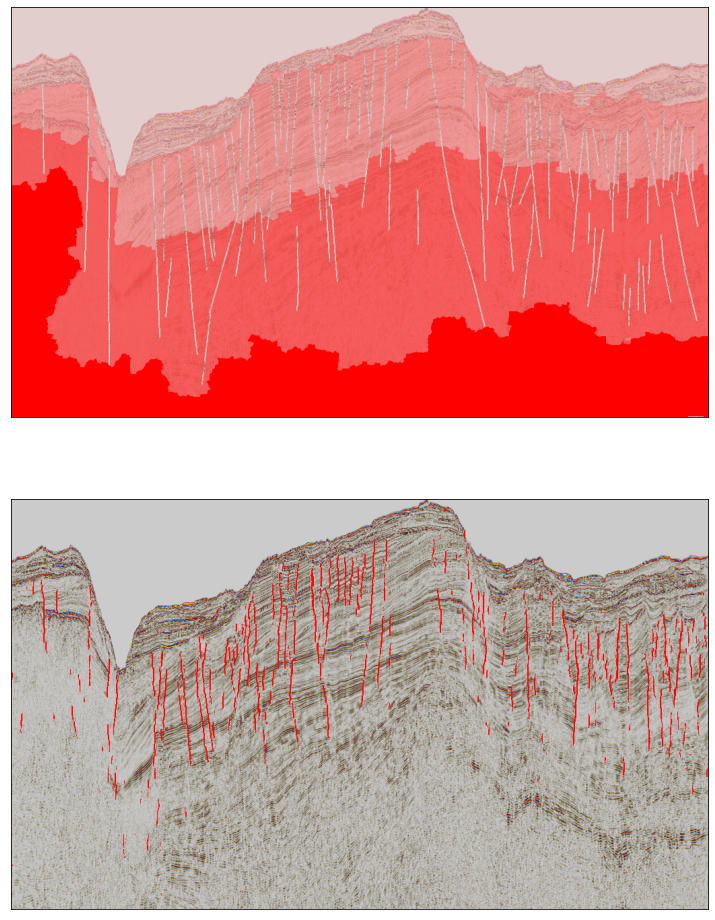

In [18]:
dt = 8
dx = 8

plt.figure(figsize=(100,80))
    
sample = SegmentsDataset(release_1)     
data, label = load_data_label_no_segment(sample[0])
plot_overlay(data, label, 0)

(t_max, x_max, _) = data.shape

data_tiles = tile_no_segment(data, size, dt, dx)
result_tiles = 1.*(model.predict_on_batch(data_tiles)>0.5)
result       = 1.*(merge_no_segment(result_tiles, t_max, x_max, size, dt, dx)>0.5)
plot_overlay(data, result[:,:,0], 1)
print((t_max, x_max,))

### in each patch howmany pixels have lable 1

In [19]:
def line_detect(patch):    
   
    flag = 0
    X = []
    for i in range(patch.shape[0]):
        for j in range(patch.shape[1]):
            if patch[i,j] and not flag:
                flag = 1
                X.append([i, j])
            if patch[i,j:j+1]:
                flag = 0

    x_left = []
    x_right = []

    for x in X:
        if x[1]<4:
            x_left.append(x)
        else:
            x_right.append(x)
    return x_right, x_left


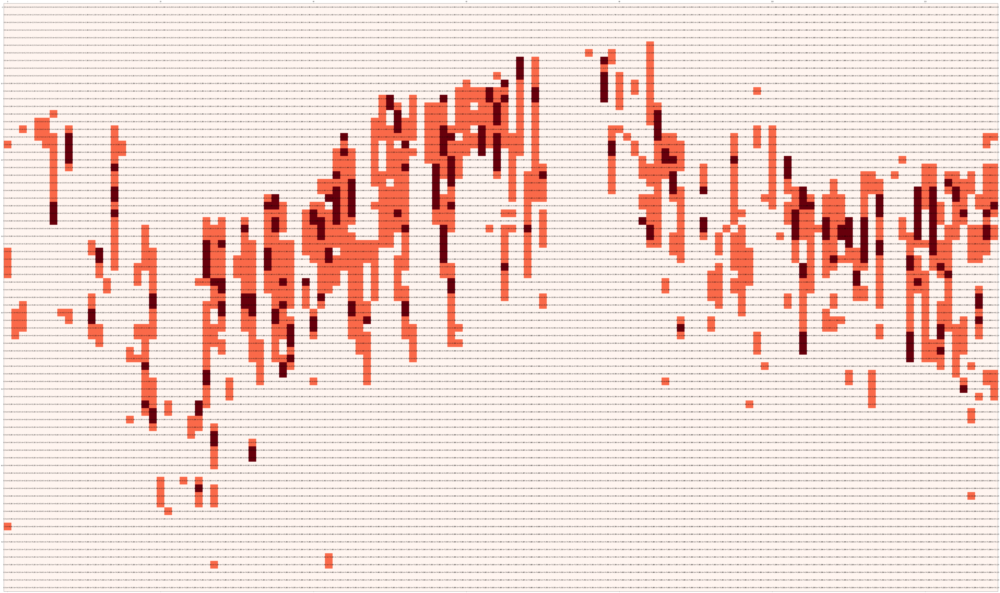

In [20]:
def tile(data, wsize, dt, dx):
    
    (t_max, x_max, _) = data.shape    
    
    n_patch = (t_max//dt+1)*(x_max//dx+1)
    data_patch = np.zeros(((t_max//dt+1), (x_max//dx+1),dt,dx,3)) 

    n_t = 0
    
    N = []
    
    for n_t, t in enumerate(range(0, t_max, dt)): 
        
        for n_x, x in enumerate(range(0, x_max, dx)):

            N.append([t,x])
            if t_max - t < dt and x_max - x < dx:
                data_patch[n_t,n_x,:,:,:] = data[t_max-dt:t_max, x_max-dx:x_max,:3]
            elif t_max - t < dt:
                data_patch[n_t,n_x,:,:,:] = data[t_max-dt:t_max, x:x+dx,:3]
            elif x_max - x < dx:
                data_patch[n_t,n_x,:,:,:] = data[t:t+dt, x_max-dx:x_max,:3]
            else:
                data_patch[n_t,n_x,:,:,:] = data[t:t+dt,x:x+dx, :3]  

    return data_patch, N

data_tiles, N = tile(result, size, dt, dx)

def slope(x1, y1, x2, y2): # Line slope given two points:
    return (y2-y1)/(x2-x1)

def angle(s1, s2): 
    return math.degrees(math.atan((s2-s1)/(1+(s2*s1))))
    
def counter_line(data_tiles):
    
    counter = np.zeros((data_tiles.shape[0], data_tiles.shape[1]))
    result_tiles_interp = np.zeros((data_tiles.shape[0],data_tiles.shape[1],data_tiles.shape[2],data_tiles.shape[3]))

    for i in range(data_tiles.shape[0]):
        for j in range(data_tiles.shape[1]):
            res_tile = data_tiles[i,j, ...]

            x_right, x_left = line_detect(res_tile)
            res_right = np.zeros((8,8))
            res_left = np.zeros((8,8))
            if x_right:
                
                x1, x2 = 0, 7
                y1, y2 = x_right[0][1], x_right[-1][1]
                res_right = cv2.line(np.uint8(res_tile*255), (y1,x1), (y2,x2), (255), 1)
                counter[i,j] += 1
            if x_left:
                
                x1, x2 = 0, 7
                y1, y2 = x_left[0][1], x_left[-1][1]
                res_left = cv2.line(np.uint8(res_tile*255), (y1,x1), (y2,x2), (255), 1)
                counter[i,j] += 1
                
            result_tiles_interp[i,j,...] = np.add(res_left, res_right)
    return counter, result_tiles_interp

num_lines_in_patch, result_interp = counter_line(np.sum(data_tiles, axis=-1)/3) 

min_val, max_val = np.min(num_lines_in_patch), np.max(num_lines_in_patch)

plt.rcParams["figure.autolayout"] = True

fig, ax = plt.subplots(figsize=(100,100))
img = ax.imshow(result)

ax.matshow(num_lines_in_patch, cmap=plt.cm.Reds)

for i in range(num_lines_in_patch.shape[0]):
    for j in range(num_lines_in_patch.shape[1]):
        c=str(num_lines_in_patch[i,j]) + f' id={i},{j}'
        ax.text(j, i, c, va='center', ha='center')
plt.show()      

In [25]:
def merge_no_segment(data_patch, t_max, x_max, wsize, dt, dx):

    data_new = np.zeros((t_max, x_max))
    count = np.zeros((t_max, x_max))
    
    n = 0
    for t in range(0, t_max, dt):
        for x in range(0, x_max, dx):
            if t_max - t < dt and x_max - x < dx:
                data_new[t_max-dt:t_max, x_max-dx:x_max] += data_patch[n, :,:]
                count[t_max-dt:t_max, x_max-dx:x_max] += 1
            elif x_max - x < dx:
                data_new[t:t+dt, x_max-dx:x_max] += data_patch[n,:,:]
                count[t:t+wsize, x_max-dx:x_max] += 1 
            elif t_max - t < dt:
                data_new[t_max-dt:t_max, x:x+dx] += data_patch[n,:,:]
                count[t_max-dt:t_max, x:x+dx] += 1
            else:
                data_new[t:t+dt,x:x+dx] += data_patch[n,:,:]
                count[t:t+dt,x:x+dx] += 1 

            n = n + 1
    return data_new/255

(610, 1037)


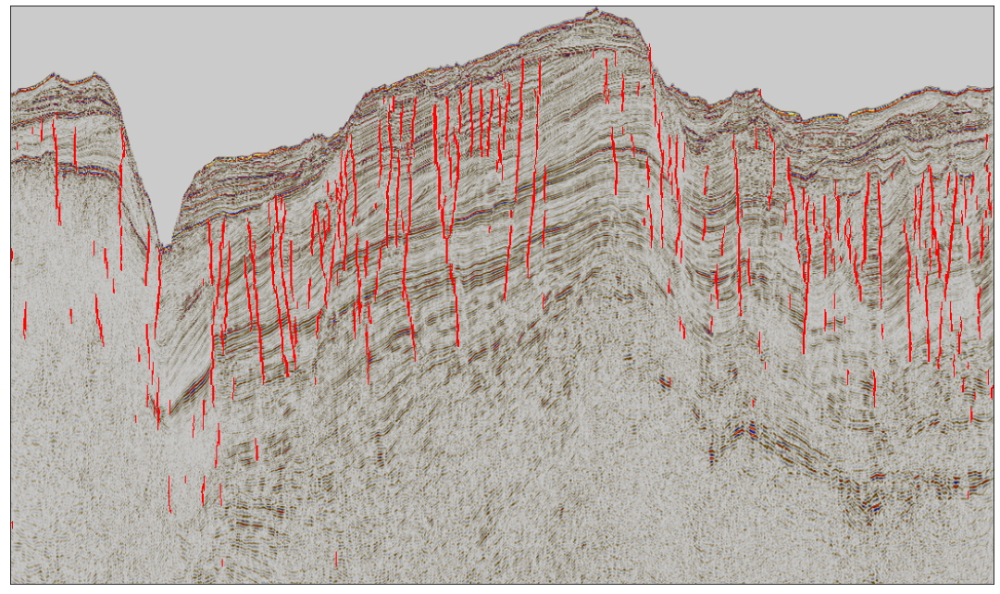

In [26]:
dt = 8
dx = 8
wsize = 8
plt.figure(figsize=(100,80))
(t_max, x_max, _) = data.shape

res_reshape = np.reshape(result_interp, (result_interp.shape[0]*result_interp.shape[1], result_interp.shape[2], result_interp.shape[3]))
result       = 1.0*(merge_no_segment(res_reshape, t_max, x_max, wsize, dt, dx)>0.05)
plot_overlay(data, result, 1)
print((t_max, x_max,))



In [21]:
result
(m,n)=result.shape
print((m,n))

(610, 1037)


In [27]:
import numpy as np

# Create a matrix of zeros of size (427, 1037)
zeros_matrix = np.zeros((427, 1037))

# Stack the original matrix on top of the zeros matrix to get a square matrix of size (1037, 1037)
square_matrix = np.vstack((result, zeros_matrix))

print(square_matrix.shape)

(1037, 1037)


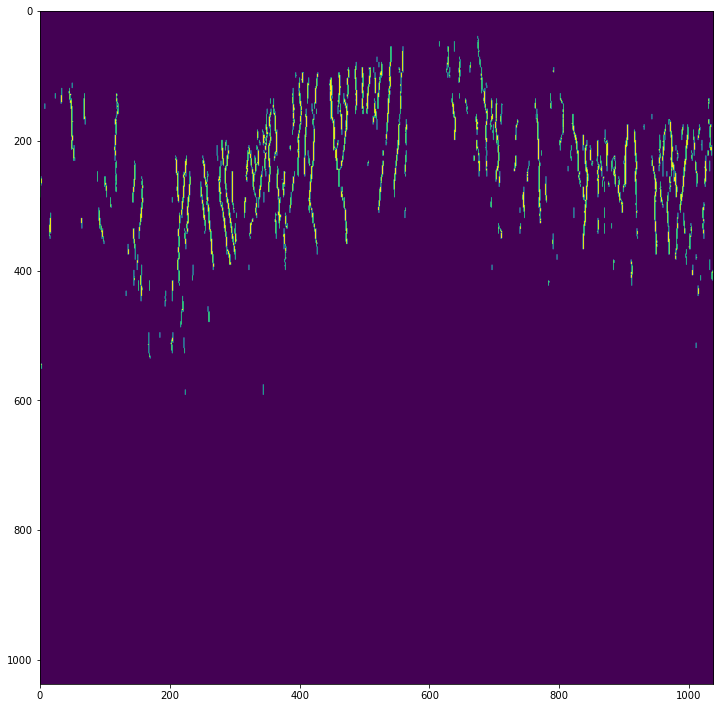

In [23]:
fig = plt.figure(figsize=(10, 10))
plt.imshow(square_matrix)

#plt.imshow(result_2)

In [24]:

print(square_matrix)

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


## Rotation matrix

In [28]:
np.set_printoptions(precision=3)
np.set_printoptions(linewidth=1000)

theta = np.pi/2

# Define the rotation matrix
rotation_matrix = np.zeros((1037, 1037))
for i in range(1037):
    for j in range(1037):
        if i == j:
            rotation_matrix[i, j] = 1
        else:
            rotation_matrix[i, j] = 0

# Define the sine and cosine of the rotation angle
c = np.cos(theta)
s = np.sin(theta)

# Update the rotation matrix with the appropriate values
rotation_matrix[0, 0] = c
rotation_matrix[0, 1] = -s
rotation_matrix[1, 0] = s
rotation_matrix[1, 1] = c

# Verify that the matrix is orthogonal
print(np.allclose(np.dot(rotation_matrix, rotation_matrix.T), np.eye(1037)))
# Output: True

# Verify that the determinant is +1
print(np.linalg.det(rotation_matrix))

# Print the matrix
print(rotation_matrix)

# Print the dimensions of the matrix
print()



True
1.0
[[ 6.123e-17 -1.000e+00  0.000e+00 ...  0.000e+00  0.000e+00  0.000e+00]
 [ 1.000e+00  6.123e-17  0.000e+00 ...  0.000e+00  0.000e+00  0.000e+00]
 [ 0.000e+00  0.000e+00  1.000e+00 ...  0.000e+00  0.000e+00  0.000e+00]
 ...
 [ 0.000e+00  0.000e+00  0.000e+00 ...  1.000e+00  0.000e+00  0.000e+00]
 [ 0.000e+00  0.000e+00  0.000e+00 ...  0.000e+00  1.000e+00  0.000e+00]
 [ 0.000e+00  0.000e+00  0.000e+00 ...  0.000e+00  0.000e+00  1.000e+00]]



np.set_printoptions(precision=3)        
np.set_printoptions(linewidth=1000)
#rotated_v_el = np.multiply(square_matrix,rotation_matrix)
rotated_v_el = np.matmul(square_matrix,rotation_matrix)
print(rotated_v_el)
num_rows = len(rotated_v_el)
num_cols = len(rotated_v_el[0])
dimensions = (num_rows, num_cols)
print(dimensions)
# Verify that the determinant is +1
print(np.linalg.det(rotated_v_el))

fig = plt.figure(figsize=(10, 10))
plt.imshow(rotated_v_el)

(1201, 1201)
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
0.0
-0.36280789048403495


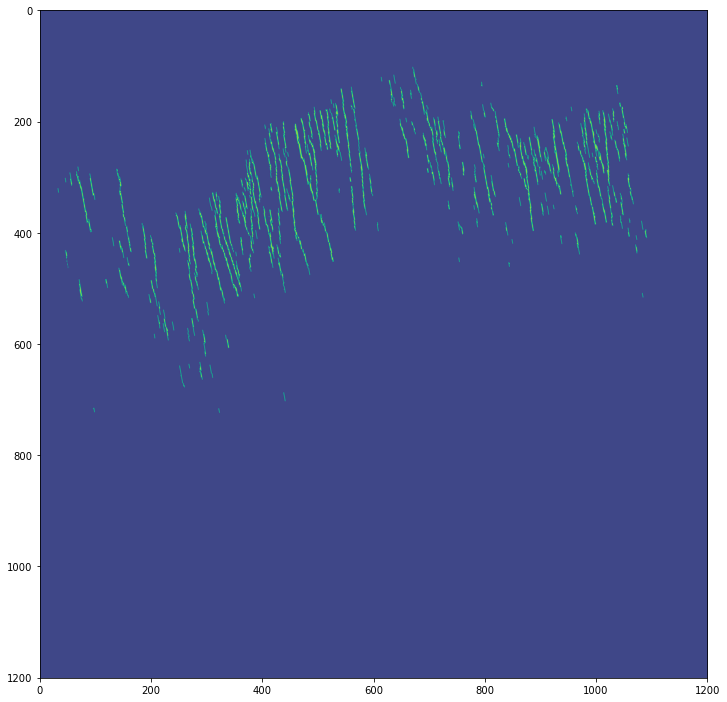

In [67]:
import numpy as np
from scipy.ndimage import rotate

#here
rotated_v_el=rotate(square_matrix, angle=10) 
fig = plt.figure(figsize=(10, 10))

# Display the matrix as an image on the plot
plt.imshow(rotated_v_el)

# Get the dimensions of the matrix and print them
num_rows = len(rotated_v_el)
num_cols = len(rotated_v_el[0])
dimensions = (num_rows, num_cols)
print(dimensions)
print(rotated_v_el)

print(np.linalg.det(rotated_v_el))
print(np.min(rotated_v_el))

<Figure size 7200x3600 with 0 Axes>

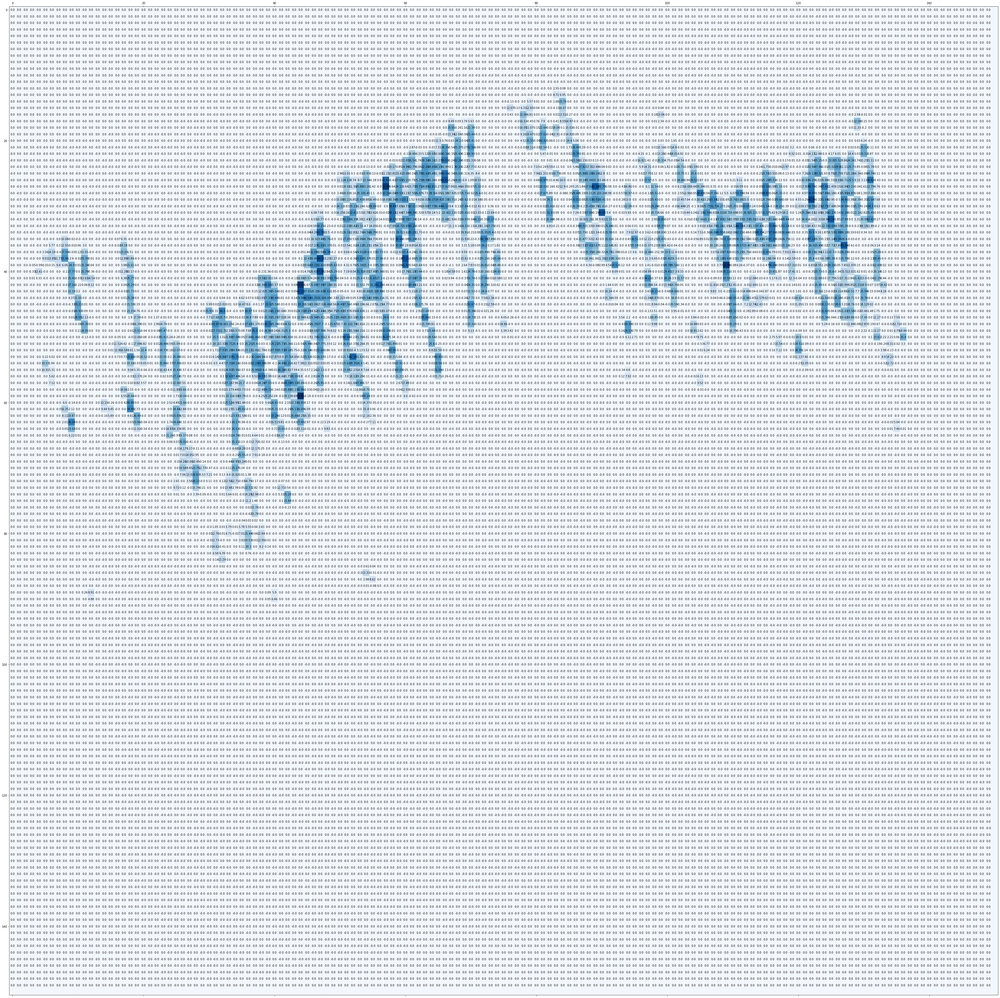

In [70]:
def counter_tile(res_data, dt, dx, seg):
    (t_max,x_max)= res_data.shape
    
    n_patch =(t_max//dt+1)*(x_max//dx+1)
    count = np.zeros((t_max//dt+1, x_max//dx+1))
    n=0
    T=[]
    N=[]
    for i, t in enumerate(range(0, t_max, dt)):
        for j, x in enumerate(range(0, x_max, dx)):
            
            if t_max - t < dt and x_max - x < dx :
                count[i,j]=np.sum(res_data[t_max-dt:t_max , x_max-dx:x_max])/dt/dx*100
            elif x_max - x < dx:
                count[i,j]=np.sum(res_data[t:t+dt, x_max-dx:x_max])/dt/dx*100
            elif t_max - t < dt:
                count[i,j]=np.sum(res_data[t_max-dt:, x:x+dx])/dt/dx*100
            else:
                count[i,j]=np.sum(res_data[t:t+dt:, x:x+dx])/dt/dx*100
            N.append(n)
            n=n+1
    return count, i, j

#here
result_count_pos_10, I, J = counter_tile(rotated_v_el, 8, 8, seg)

#result_count, I, J = counter_tile(rotated_v_el, dt, dx, seg)

plt.figure(figsize=(100,50))
fig, ax = plt.subplots(figsize=(50,50))

min_val, max_val =np.min(result_count), np.max(result_count)

#here
ax.matshow(result_count_pos_10, cmap=plt.cm.Blues)

for i in range(I):
    for j in range(J):
        #here
        c=round(result_count_pos_10[i,j], 2)
        ax.text(j, i, str(c), va='center', ha='center')

In [48]:
def patch_detect(patch):    
   
    flag = 0
    X = []
    for i in range(patch.shape[0]):
        for j in range(patch.shape[1]):
            if patch[i,j] and not flag:
                flag = 1
                X.append([i, j])
            if patch[i,j:j+1]:
                flag = 0
    return X

C:\Users\aazadkhorasa\AppData\Local\Temp\ipykernel_20052\2137177058.py:51: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt.gca().set_yticklabels(['{:,.0%}'.format(x) for x in current_values])


[Text(0, 0.0, '0%'),
 Text(0, 0.025, '2%'),
 Text(0, 0.05, '5%'),
 Text(0, 0.07500000000000001, '8%'),
 Text(0, 0.1, '10%'),
 Text(0, 0.125, '12%'),
 Text(0, 0.15000000000000002, '15%'),
 Text(0, 0.17500000000000002, '18%'),
 Text(0, 0.2, '20%')]

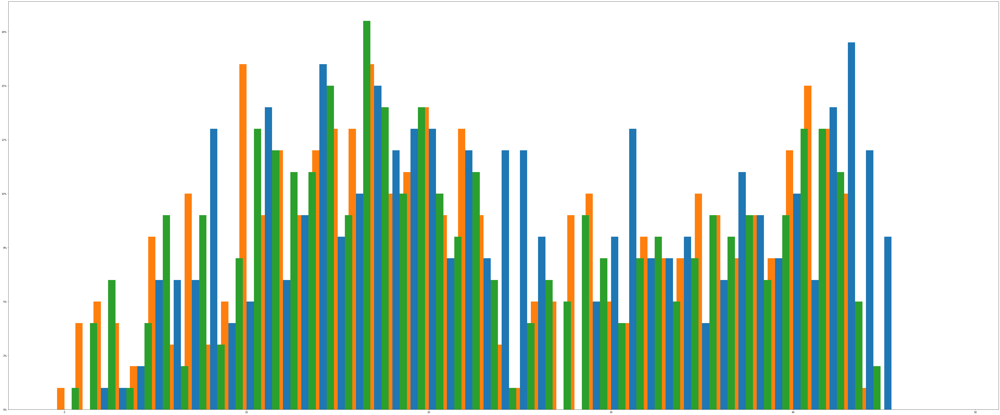

In [74]:
import pandas as pd

data_dict = {'rectangualr number':[],
             'upper':[],
             'lower':[],
             'percenatge':[]}

patch_step = 3
data = []
#here
for i in range(0, result_count_pos_10.shape[1]-patch_step+1, patch_step):
    st = list(range(i,i+patch_step))
    th = 0.5
    #here
    rect = 1.*(result_count_pos_10[:,st]>th)
    X = patch_detect(rect)
    
    percentage = round(np.sum(rect)/(rect.shape[0]*rect.shape[1]), 2)
    if X:
    
        data_dict['rectangualr number'].append(i//patch_step+1)
        data_dict['upper'].append(np.min(np.array(X)[:,0])*8)
        data_dict['lower'].append(np.max(np.array(X)[:,0])*8)
        data_dict['percenatge'].append(percentage)
    
    else:
        data_dict['rectangualr number'].append(i//patch_step+1)
        data_dict['upper'].append(np.NaN)
        data_dict['lower'].append(np.NaN)
        data_dict['percenatge'].append(percentage)

# here        
df_pos_10 = pd.DataFrame(data=data_dict)

# set figure size
plt.figure(figsize=(60,25))

# plot polar axis
ax = plt.subplot(111)

# remove grid
# plt.axis('o')

bars = plt.bar(df_neg_5.index+0.2, df_neg_5['percenatge'], 0.4)
bars = plt.bar(df_pos_5.index-0.2, df_pos_5['percenatge'], 0.4)
bars = plt.bar(df_pos_10.index-0.4, df_pos_10['percenatge'], 0.4)

# after plotting the data, format the labels
current_values = plt.gca().get_yticks()
# using format string '{:.0f}' here but you can choose others
plt.gca().set_yticklabels(['{:,.0%}'.format(x) for x in current_values])

#rotated_v_el[10:40,70:100]

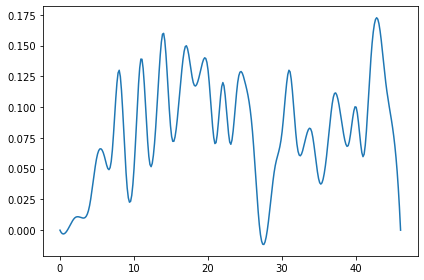

In [75]:
from scipy.interpolate import make_interp_spline

# 300 represents number of points to make between T.min and T.max
xnew = np.linspace(df_neg_5.index[0], df_neg_5.index[-1], 300)  

power_smooth = make_interp_spline(df_neg_5.index.to_numpy(), df_neg_5['percenatge'].to_numpy())

plt.plot(xnew, power_smooth(xnew))
plt.show()

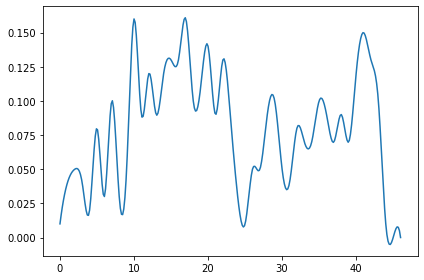

In [76]:
from scipy.interpolate import make_interp_spline

# 300 represents number of points to make between T.min and T.max
xnew = np.linspace(df_pos_5.index[0], df_pos_5.index[-1], 300)  

power_smooth = make_interp_spline(df_pos_5.index.to_numpy(), df_pos_5['percenatge'].to_numpy())

plt.plot(xnew, power_smooth(xnew))
plt.show()

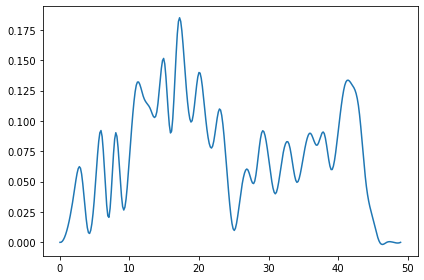

In [77]:
from scipy.interpolate import make_interp_spline

# 300 represents number of points to make between T.min and T.max
xnew = np.linspace(df_pos_10.index[0], df_pos_10.index[-1], 300)  

power_smooth = make_interp_spline(df_pos_10.index.to_numpy(), df_pos_10['percenatge'].to_numpy())

plt.plot(xnew, power_smooth(xnew))
plt.show()